In this notebook, we will build a 3D map of a scene from a small set of images and then localize an image downloaded from the Internet. This demo was contributed by [Philipp Lindenberger](https://github.com/Phil26AT/).

In [52]:
%load_ext autoreload
%autoreload 2
import tqdm, tqdm.notebook
import os, sys
BASEPATH = os.getcwd().split('code')[-2]
sys.path.append(os.path.join(BASEPATH, 'code'))
from utils import pairs_from_sequence, pairs_from_360

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Setup
Here we define some output paths.

In [55]:
images = Path("../../data/0-calibration/images")
outputs = Path("../../data/0-calibration/formattest/")
# !rm -rf $outputs
outputs.mkdir(exist_ok=True)
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

feature_conf = extract_features.confs["disk"]
matcher_conf = match_features.confs["disk+lightglue"]
# feature_conf = extract_features.confs["superpoint_aachen"]
# matcher_conf = match_features.confs["superpoint+lightglue"]

# 3D mapping
First we list the images used for mapping. These are all day-time shots of Sacre Coeur.

In [56]:
# references = [p.relative_to(images).as_posix() for p in (images).iterdir() if '360' in p.name]
references = [p.relative_to(images).as_posix() for p in images.rglob('*.jpg') if '360' in p.parent.name]
print(len(references), "mapping images")
# plot_images([read_image(images / r) for r in references], dpi=25)

200 mapping images


Then we extract features and match them across image pairs. Since we deal with few images, we simply match all pairs exhaustively. For larger scenes, we would use image retrieval, as demonstrated in the other notebooks.

In [57]:
extract_features.main(
    feature_conf, images, image_list=references, feature_path=features
)

[2024/07/16 18:07:03 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
[2024/07/16 18:07:03 hloc INFO] Skipping the extraction.


PosixPath('../../data/0-calibration/formattest/features.h5')

In [59]:


pairs_from_360.main(sfm_pairs, image_dir=images)
# pairs_from_exhaustive.main(sfm_pairs, image_list=references)
# pairs_from_sequence.main(sfm_pairs, image_list=references)
# match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches)

[2024/07/16 18:07:47 hloc INFO] Found 1780 pairs.


The we run incremental Structure-From-Motion and display the reconstructed 3D model.

In [60]:
match_features.main(matcher_conf, sfm_pairs, features=features, matches=matches);

[2024/07/16 18:07:50 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/1780 [00:00<?, ?it/s]

KeyError: Caught KeyError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/opt/homebrew/Caskroom/miniforge/base/envs/hloc/lib/python3.11/site-packages/torch/utils/data/_utils/worker.py", line 308, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
           ^^^^^^^^^^^^^^^^^^^^
  File "/opt/homebrew/Caskroom/miniforge/base/envs/hloc/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in fetch
    data = [self.dataset[idx] for idx in possibly_batched_index]
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/opt/homebrew/Caskroom/miniforge/base/envs/hloc/lib/python3.11/site-packages/torch/utils/data/_utils/fetch.py", line 51, in <listcomp>
    data = [self.dataset[idx] for idx in possibly_batched_index]
            ~~~~~~~~~~~~^^^^^
  File "/Users/grosche/Documents/GitHub/MARMOT/code/0-calibration/hloc/hloc/match_features.py", line 119, in __getitem__
    grp = fd[name0]
          ~~^^^^^^^
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "/opt/homebrew/Caskroom/miniforge/base/envs/hloc/lib/python3.11/site-packages/h5py/_hl/group.py", line 357, in __getitem__
    oid = h5o.open(self.id, self._e(name), lapl=self._lapl)
          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "h5py/_objects.pyx", line 54, in h5py._objects.with_phil.wrapper
  File "h5py/_objects.pyx", line 55, in h5py._objects.with_phil.wrapper
  File "h5py/h5o.pyx", line 241, in h5py.h5o.open
KeyError: 'Unable to open object (component not found)'


In [34]:
import pycolmap

model = pycolmap.Reconstruction(outputs / 'testflip' / 'sparse' / '0')

In [37]:
def main(
    sfm_dir: Path,
    image_dir: Path,
    pairs: Path,
    features: Path,
    matches: Path,
    camera_mode: pycolmap.CameraMode = pycolmap.CameraMode.AUTO,
    verbose: bool = False,
    skip_geometric_verification: bool = False,
    min_match_score: Optional[float] = None,
    image_list: Optional[List[str]] = None,
    image_options: Optional[Dict[str, Any]] = None,
    mapper_options: Optional[Dict[str, Any]] = None,
)

{1: Camera(camera_id=1, model=SIMPLE_RADIAL, width=960, height=960, params=[480.166202, 480.000000, 480.000000, 0.000106] (f, cx, cy, k))}

In [9]:
# opts = dict(camera_model = "SIMPLE_RADIAL", camera_params =','.join(map(str, (1, 256, 256, 0))))
import pycolmap
model = reconstruction.main(
    sfm_dir, images, sfm_pairs, features, matches, image_list=references, camera_mode=pycolmap.CameraMode.PER_FOLDER)
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(
    fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True
)
fig.show()



[2024/07/16 16:56:45 hloc INFO] Creating an empty database...


[2024/07/16 16:56:45 hloc INFO] Importing images into the database...
[2024/07/16 16:56:46 hloc INFO] Importing features into the database...


  0%|          | 0/200 [00:00<?, ?it/s]

[2024/07/16 16:56:46 hloc INFO] Importing matches into the database...


  0%|          | 0/1529 [00:00<?, ?it/s]

[2024/07/16 16:56:46 hloc INFO] Performing geometric verification of the matches...
I20240716 16:56:46.980873 5341772 misc.cc:198] 
Custom feature matching
I20240716 16:56:46.983551 5341772 feature_matching.cc:1021] Matching block [1/2]
I20240716 16:56:53.770692 5341772 feature_matching.cc:46]  in 6.787s
I20240716 16:56:53.777520 5341772 feature_matching.cc:1021] Matching block [2/2]
I20240716 16:56:55.963253 5341772 feature_matching.cc:46]  in 2.186s
I20240716 16:56:55.964289 5341772 timer.cc:91] Elapsed time: 0.150 [minutes]
[2024/07/16 16:56:56 hloc INFO] Running 3D reconstruction...
I20240716 16:56:56.011957 5341943 misc.cc:198] 
Loading database
I20240716 16:56:56.012722 5341943 database_cache.cc:54] Loading cameras...
I20240716 16:56:56.012748 5341943 database_cache.cc:64]  4 in 0.000s
I20240716 16:56:56.012763 5341943 database_cache.cc:72] Loading matches...
I20240716 16:56:56.014453 5341943 database_cache.cc:78]  814 in 0.002s
I20240716 16:56:56.014472 5341943 database_cache.cc

We also visualize which keypoints were triangulated into the 3D model.

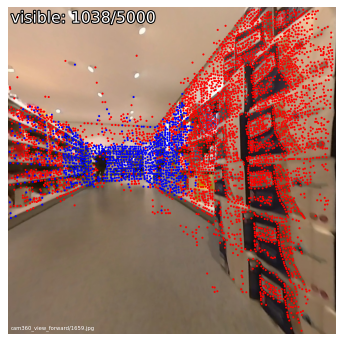

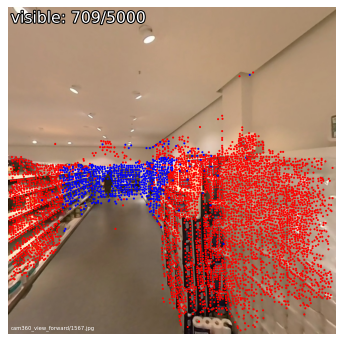

In [10]:
visualization.visualize_sfm_2d(model, images, color_by="visibility", n=2)

# Localization
Now that we have a 3D map of the scene, we can localize any image. To demonstrate this, we download [a night-time image from Wikimedia](https://commons.wikimedia.org/wiki/File:Paris_-_Basilique_du_Sacr%C3%A9_Coeur,_Montmartre_-_panoramio.jpg).

In [ ]:
# url = "https://upload.wikimedia.org/wikipedia/commons/5/53/Paris_-_Basilique_du_Sacr%C3%A9_Coeur%2C_Montmartre_-_panoramio.jpg"
# # try other queries by uncommenting their url
# # url = "https://upload.wikimedia.org/wikipedia/commons/5/59/Basilique_du_Sacr%C3%A9-C%C5%93ur_%285430392880%29.jpg"
# # url = "https://upload.wikimedia.org/wikipedia/commons/8/8e/Sacr%C3%A9_C%C5%93ur_at_night%21_%285865355326%29.jpg"
# query = "query/night.jpg"
# !mkdir -p $images/query && wget $url -O $images/$query -q
# plot_images([read_image(images / query)], dpi=75)

Again, we extract features for the query and match them exhaustively.

In [11]:
# database = pycolmap.Database(outputs / 'testflip' / 'database.db')
# database.read_all_images()

In [36]:
query = ['cam1_view_forward/100.jpg', 'cam2_view_forward/100.jpg', 'cam3_view_forward/100.jpg']

extract_features.main(
    feature_conf, images, image_list=query, feature_path=features, overwrite=True
)
pairs_from_exhaustive.main(loc_pairs, image_list=query, ref_list=references)


match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True
);

[2024/07/16 17:37:06 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}


  0%|          | 0/3 [00:00<?, ?it/s]

[2024/07/16 17:37:22 hloc INFO] Finished exporting features.
[2024/07/16 17:37:22 hloc INFO] Found 600 pairs.
[2024/07/16 17:37:22 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}


  0%|          | 0/600 [00:00<?, ?it/s]

[2024/07/16 17:54:31 hloc INFO] Finished exporting matches.


We read the EXIF data of the query to infer a rough initial estimate of camera parameters like the focal length. Then we estimate the absolute camera pose using PnP+RANSAC and refine the camera parameters.

In [26]:
import pycolmap

In [27]:
camera = pycolmap.infer_camera_from_image(images / query)

In [29]:
camera.params = [640, 640, 340, 0]


found 248/680 inlier correspondences.
found 56/496 inlier correspondences.
found 1340/2005 inlier correspondences.


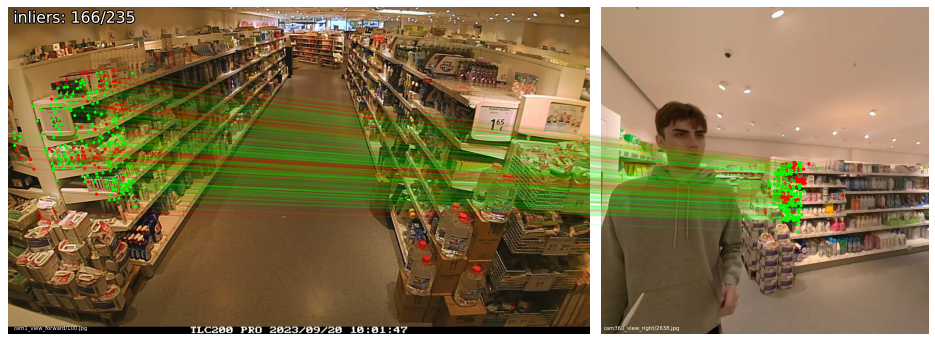

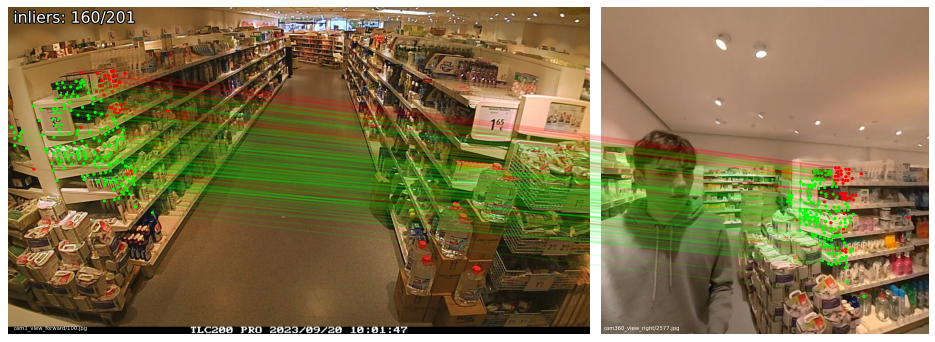

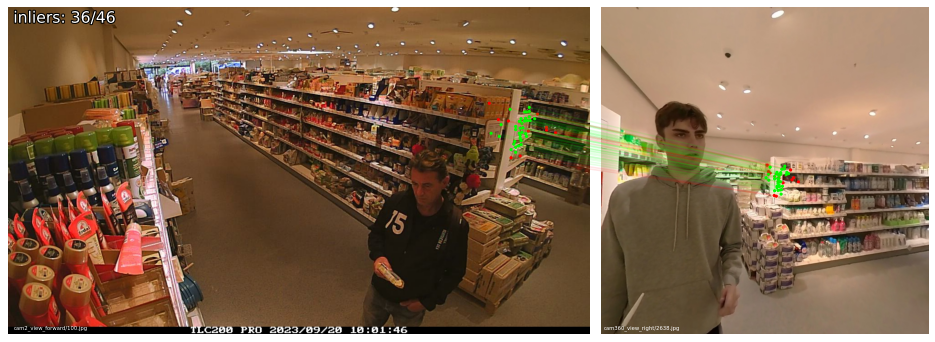

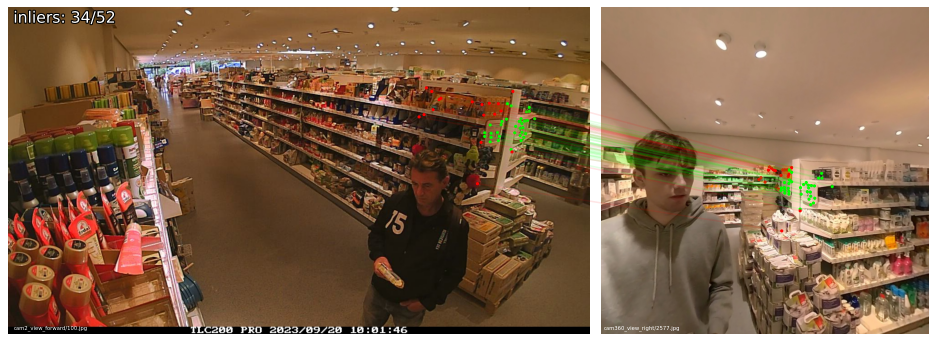

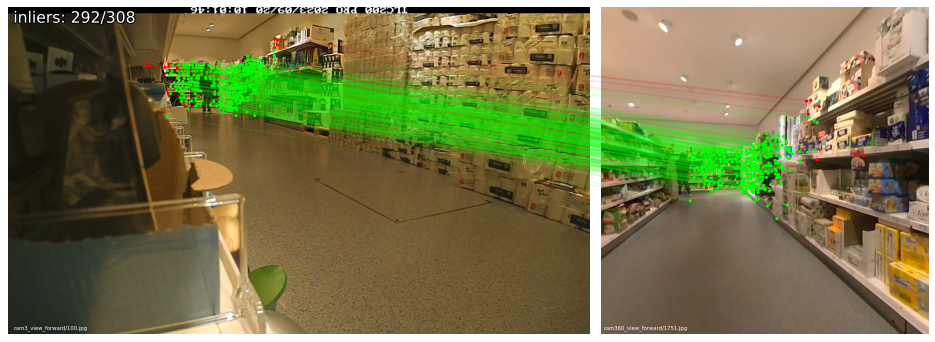

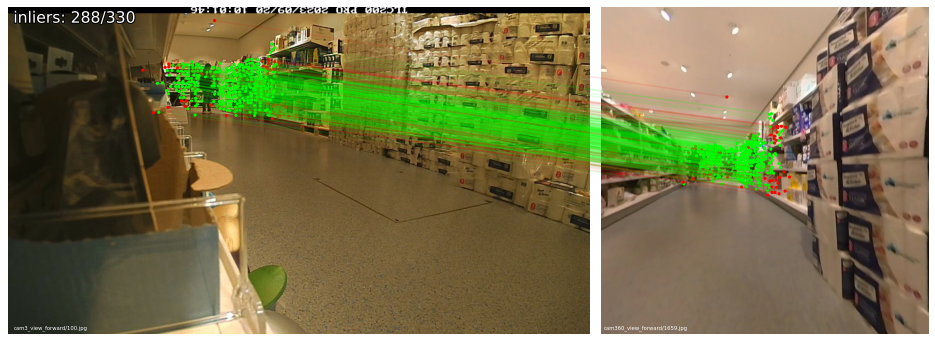

In [38]:
import pycolmap
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

# camera = pycolmap.infer_camera_from_image(images / query)
ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]
conf = {
    "estimation": {"ransac": {"max_error": 12}},
    "refinement": {"refine_focal_length": False, "refine_extra_params": False},
}
localizer = QueryLocalizer(model, conf)
for query_ in query:
    ret, log = pose_from_cluster(localizer, query_, camera, ref_ids, features, matches)

    print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')
    visualization.visualize_loc_from_log(images, query_, log, model)

We visualize the correspondences between the query images a few mapping images. We can also visualize the estimated camera pose in the 3D map.

In [31]:
ret['cam_from_world']

Rigid3d(quat_xyzw=[0.144374, -0.513329, -0.137785, 0.834664], t=[-2.90077, -0.946276, 3.83447])

In [43]:
pose.cam_from_world.inverse().translation

array([-2.85466237,  0.94875839, -0.34588149])

In [34]:
pose

Image(image_id=Invalid, camera_id=Invalid, name="", triangulated=0/0)

In [40]:
pose = pycolmap.Image(cam_from_world=ret["cam_from_world"])
viz_3d.plot_camera_colmap(
    fig, pose, camera, color="rgba(0,255,0,0.5)", name=query, fill=True
)
# visualize 2D-3D correspodences
inl_3d = np.array(
    [model.points3D[pid].xyz for pid in np.array(log["points3D_ids"])[ret["inliers"]]]
)
viz_3d.plot_points(fig, inl_3d, color="lime", ps=1, name=query)
fig.show()

In [2]:
import tqdm, tqdm.notebook

tqdm.tqdm = tqdm.notebook.tqdm  # notebook-friendly progress bars
from pathlib import Path
import numpy as np
import os
import sys
import pycolmap
# Path to the code directory
BASEPATH = os.path.dirname(os.getcwd()).split('code')[-2]
CODEPATH = os.path.join(BASEPATH, 'code')
DATAPATH = os.path.join(BASEPATH, 'data')
sys.path.append(CODEPATH)


from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_exhaustive,
)
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d
from hloc.localize_sfm import QueryLocalizer, pose_from_cluster

from utils.log_utils import log
from utils.multiview_utils import Camera, Calibration
from utils.metadata_utils import get_cam_names
from configs.arguments import get_config_dict
from utils.io_utils import write_json

images = Path(DATAPATH) / "0-calibration" / "images"
outputs = Path(DATAPATH) / "outputs"
omni_tag = "360"


# define paths to output files
sfm_pairs = outputs / "pairs-sfm.txt"
loc_pairs = outputs / "pairs-loc.txt"
sfm_dir = outputs / "sfm"
features = outputs / "features.h5"
matches = outputs / "matches.h5"

# clear output directory
if not outputs.exists():
    outputs.mkdir()
else:
    for p in outputs.iterdir():
        if p.is_file():
            p.unlink()

# configurations
feature_conf = extract_features.confs["superpoint_aachen"]
matcher_conf = match_features.confs["superpoint+lightglue"]

# reference images (360)
references = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag in p.name]

# extract features
extract_features.main(
    feature_conf, images, image_list=references, feature_path=features
)

# generate pairs
pairs_from_exhaustive.main(sfm_pairs, image_list=references)

# match features
match_features.main(
    matcher_conf, sfm_pairs, features=features, matches=matches
)
opts = dict(camera_model = "SIMPLE_RADIAL")#, camera_params =','.join(map(str, (256, 256, 256, 0))))

model = reconstruction.main(
    sfm_dir, images, sfm_pairs, features, matches, image_list=references, image_options = opts
)
# pose cameras
cams = get_cam_names(images, omni_tag=omni_tag)



[2024/07/03 22:10:32 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:10:38 hloc INFO] Finished exporting features.
[2024/07/03 22:10:38 hloc INFO] Found 16110 pairs.
[2024/07/03 22:10:38 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}


  0%|          | 0/16110 [00:00<?, ?it/s]

[2024/07/03 22:20:36 hloc INFO] Finished exporting matches.
[2024/07/03 22:20:36 hloc WARNING] The database already exists, deleting it.
[2024/07/03 22:20:36 hloc INFO] Creating an empty database...
[2024/07/03 22:20:37 hloc INFO] Importing images into the database...
[2024/07/03 22:20:39 hloc INFO] Importing features into the database...


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:20:40 hloc INFO] Importing matches into the database...


  0%|          | 0/16110 [00:00<?, ?it/s]

[2024/07/03 22:22:19 hloc INFO] Performing geometric verification of the matches...
I20240703 22:22:19.858155 26207 misc.cc:198] 
Custom feature matching
I20240703 22:22:19.909556 26207 feature_matching.cc:1021] Matching block [1/14]
I20240703 22:22:22.865985 26207 feature_matching.cc:46]  in 2.956s
I20240703 22:22:22.908780 26207 feature_matching.cc:1021] Matching block [2/14]
I20240703 22:22:25.521446 26207 feature_matching.cc:46]  in 2.613s
I20240703 22:22:25.557741 26207 feature_matching.cc:1021] Matching block [3/14]
I20240703 22:22:28.504693 26207 feature_matching.cc:46]  in 2.947s
I20240703 22:22:28.540707 26207 feature_matching.cc:1021] Matching block [4/14]
I20240703 22:22:30.532397 26207 feature_matching.cc:46]  in 1.992s
I20240703 22:22:30.560894 26207 feature_matching.cc:1021] Matching block [5/14]
I20240703 22:22:32.816938 26207 feature_matching.cc:46]  in 2.256s
I20240703 22:22:32.857461 26207 feature_matching.cc:1021] Matching block [6/14]
I20240703 22:22:34.791059 26207

In [10]:
from utils.multiview_utils import Camera, Calibration

In [12]:
cam = cams[0]

camera = Camera(cam, newest=False, data_root =  Path("../../data/"))


TypeError: Camera.__init__() got an unexpected keyword argument 'data_root'

In [6]:
%tb

SystemExit: 2

In [13]:
query = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag not in p.name and cam in p.name][0]
print(query)
camera_colmap = pycolmap.infer_camera_from_image(images / query)

cam1_100.jpg


In [14]:
camera_colmap

Camera(camera_id=Invalid, model=SIMPLE_RADIAL, width=1280, height=720, params=[1536.000000, 640.000000, 360.000000, 0.000000] (f, cx, cy, k))

In [15]:
ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]

In [16]:
ref_ids

[1,
 2,
 4,
 7,
 8,
 9,
 10,
 13,
 15,
 16,
 19,
 21,
 22,
 25,
 27,
 31,
 33,
 34,
 37,
 39,
 40,
 43,
 45,
 49,
 51,
 55,
 58,
 61,
 62,
 63,
 64,
 67,
 68,
 69,
 70,
 74,
 75,
 76,
 80,
 81,
 82,
 86,
 87,
 88,
 92,
 93,
 94,
 98,
 99,
 100,
 103,
 104,
 105,
 106,
 110,
 111,
 112,
 116,
 117,
 118,
 122,
 123,
 124,
 128,
 129,
 130,
 134,
 135,
 136,
 140,
 141,
 142,
 146,
 147,
 148,
 152,
 153,
 154,
 158,
 159,
 160,
 164,
 165,
 166,
 170,
 171,
 172,
 176,
 177,
 178]

In [21]:
extract_features.main(
    feature_conf, images, image_list=[query], feature_path=features, overwrite=True
)
pairs_from_exhaustive.main(loc_pairs, image_list=[query], ref_list=references)
match_features.main(
    matcher_conf, loc_pairs, features=features, matches=matches, overwrite=True
);

[2024/07/03 22:39:49 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 4096, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-r1024',
 'preprocessing': {'grayscale': True, 'resize_max': 1024}}


Loaded SuperPoint model


  0%|          | 0/1 [00:00<?, ?it/s]

[2024/07/03 22:39:50 hloc INFO] Finished exporting features.
[2024/07/03 22:39:50 hloc INFO] Found 180 pairs.
[2024/07/03 22:39:50 hloc INFO] Matching local features with configuration:
{'model': {'features': 'superpoint', 'name': 'lightglue'},
 'output': 'matches-superpoint-lightglue'}


  0%|          | 0/180 [00:00<?, ?it/s]

[2024/07/03 22:39:58 hloc INFO] Finished exporting matches.


In [22]:
conf = {
            "estimation": {"ransac": {"max_error": 12}},
            "refinement": {"refine_focal_length": True, "refine_extra_params": True},
        }
localizer = QueryLocalizer(model, conf)

In [23]:
ret, log = pose_from_cluster(localizer, query, camera_colmap, ref_ids, features, matches)

In [24]:
ret

{'cam_from_world': Rigid3d(quat_xyzw=[0.0745716, 0.438368, 0.112469, 0.888608], t=[5.03544, -0.19027, 6.86187]),
 'num_inliers': 28,
 'inliers': array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
    

In [ ]:
for cam in cams:
        print(f"Processing camera {cam}")
        camera = Camera(cam, newest=False)      
        query = [p.relative_to(images).as_posix() for p in (images).iterdir() if omni_tag not in p.name and cam in p.name][0]
        print(query)
        camera_colmap = pycolmap.infer_camera_from_image(images / query)
        ref_ids = [model.find_image_with_name(r).image_id for r in references if model.find_image_with_name(r) is not None]
        conf = {
            "estimation": {"ransac": {"max_error": 12}},
            "refinement": {"refine_focal_length": True, "refine_extra_params": True},
        }
        localizer = QueryLocalizer(model, conf)
        ret, log = pose_from_cluster(localizer, query, camera_colmap, ref_ids, features, matches)
        pose = ret['cam_from_world']

        print(f'found {ret["num_inliers"]}/{len(ret["inliers"])} inlier correspondences.')

        camera.set_calib(Calibration(
                R=pose.rotation.matrix(), 
                T=pose.translation, view_id=camera.calibration.view_id, 
                K=camera.calibration.K, 
                K_new=camera.calibration.K_new, 
                dist=camera.calibration.dist,
                size = camera.calibration.size))
        if camera.is_calibrated():
            log.info(f"Camera {cam} calibrated.")
            camera.save_calibration()

if __name__ == '__main__':
    main()